In [8]:
# Monter votre Drive afin de pouvoir y'acceder
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [9]:
# nous supposons que la base d'image se trouve dans le répertoire "IA-Vision" de votre Drive
from zipfile import ZipFile
file_name = "/content/drive/MyDrive/Deep_learning/data.zip"

with ZipFile(file_name, 'r') as zip:
  zip.extractall()
  print('Done')

Done


In [30]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#To see our directory
import os
import random
import gc

In [27]:
train_dir = '/content/data/train'
test_dir = '/content/data/validation'
train_dogs = ['/content/data/train/{}'.format(i) for i in os.listdir(train_dir) if 'dog' in i] #get dog images
train_cats = ['/content/data/train/{}'.format(i) for i in os.listdir(train_dir) if 'cat' in i] #get cat images
test_imgs = ['/content/data/validation/{}'.format(i) for i in os.listdir(test_dir)] #get test images
train_imgs = train_dogs[:2000] + train_cats[:2000] # slice the datasetand use 2000 in each class
random.shuffle(train_imgs) # shuffle it randomly

['/content/data/train/dog.232.jpg',
 '/content/data/train/dog.36.jpg',
 '/content/data/train/dog.644.jpg',
 '/content/data/train/dog.791.jpg',
 '/content/data/train/dog.382.jpg',
 '/content/data/train/dog.400.jpg',
 '/content/data/train/dog.476.jpg',
 '/content/data/train/dog.997.jpg',
 '/content/data/train/dog.817.jpg',
 '/content/data/train/dog.663.jpg',
 '/content/data/train/dog.341.jpg',
 '/content/data/train/dog.953.jpg',
 '/content/data/train/dog.453.jpg',
 '/content/data/train/dog.314.jpg',
 '/content/data/train/dog.775.jpg',
 '/content/data/train/dog.481.jpg',
 '/content/data/train/dog.81.jpg',
 '/content/data/train/dog.349.jpg',
 '/content/data/train/dog.135.jpg',
 '/content/data/train/dog.57.jpg',
 '/content/data/train/dog.347.jpg',
 '/content/data/train/dog.776.jpg',
 '/content/data/train/dog.635.jpg',
 '/content/data/train/dog.322.jpg',
 '/content/data/train/dog.969.jpg',
 '/content/data/train/dog.665.jpg',
 '/content/data/train/dog.372.jpg',
 '/content/data/train/dog.572.j

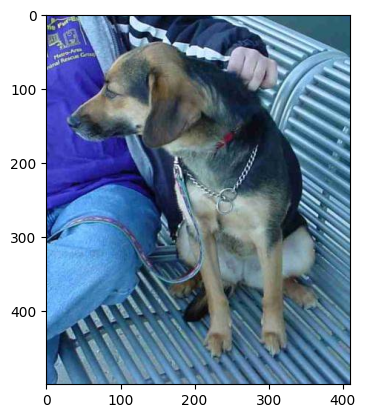

In [13]:
import matplotlib.image as mpimg
for ima in train_imgs[0:3]:
  img=mpimg.imread(ima)
imgplot = plt.imshow(img)
plt.show()

In [16]:
import cv2

# Let's declare our image dimensions
# We are using colored images.
nrows = 150
ncolumns = 150
channels = 3  # Change to 1 if you want to use grayscale images

# A function to read and process the images to an acceptable format for our model
def read_and_process_image(list_of_images):
    """
    Returns two arrays:
    X is an array of resized images
    y is an array of labels
    """
    X = []  # images
    y = []  # labels

    for image in list_of_images:
        # Read the image
        im = cv2.imread(image, cv2.IMREAD_COLOR)

        # Resize the image
        im2 = cv2.resize(im, (nrows, ncolumns), interpolation=cv2.INTER_CUBIC)

        # Append the processed image to the list
        X.append(im2)

        # Get the labels based on the image filename
        if 'dog' in image:
            y.append(1)
        elif 'cat' in image:
            y.append(0)

    return X, y

In [17]:
#get the train and label data
X, y = read_and_process_image(train_imgs)

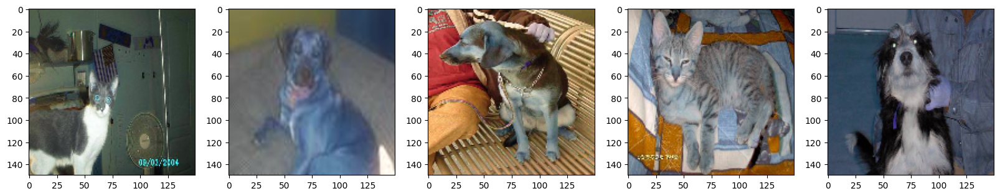

In [26]:
#Lets view some of the pics
plt.figure(figsize=(20,10))
columns = 5
for i in range(columns):
  plt.subplot(int(5 / columns + 1), columns, i + 1)
  imgplot = plt.imshow(X[i])
plt.show()

In [28]:
X = np.array(X)
y = np.array(y)

print("Shape of train images is:", X.shape)
print("Shape of labels is:", y.shape)

Shape of train images is: (2048, 150, 150, 3)
Shape of labels is: (2048,)


In [32]:
#Lets split the data into train and test set
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.20, random_state=2)
print("Shape of train images is:", X_train.shape)
print("Shape of validation images is:", X_val.shape)
print("Shape of labels is:", y_train.shape)
print("Shape of labels is:", y_val.shape)
#clear memory
del X
del y
gc.collect()
#get the length of the train and validation data
ntrain = len(X_train)
nval = len(X_val)
#We will use a batch size of 32. Note: batch size should be a factor of 2.***4,8,16,32,64...***
batch_size = 32

Shape of train images is: (1638, 150, 150, 3)
Shape of validation images is: (410, 150, 150, 3)
Shape of labels is: (1638,)
Shape of labels is: (410,)


In [38]:
#Lets import the necessary libraries
from tensorflow.keras import layers #updated line
from tensorflow.keras import models #updated line
from tensorflow.keras import optimizers #updated line
from tensorflow.keras.preprocessing.image import ImageDataGenerator #updated line
from tensorflow.keras.preprocessing.image import img_to_array, load_img #updated line

In [39]:
model = models.Sequential() # (1)
model.add(layers.Conv2D(32, (3, 3), activation='relu',input_shape=(150,
150, 3)))#(2)
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2))) # (3)
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten()) # (4)
model.add(layers.Dropout(0.5)) #Dropout for regularization # (5)
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid')) # (6) #Sigmoid function at the end because we have just two classes

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [40]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 148, 148, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 74, 74, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 72, 72, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 36, 36, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 34, 34, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 17, 17, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 15, 15, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 7, 7, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 6272)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 6272)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       3,211,776 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,453,121 (13.17 MB)

 Trainable params: 3,453,121 (13.17 MB)

 Non-trainable params: 0 (0.00 B)

In [43]:
model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4), # Changed 'lr' to 'learning_rate'
              metrics=['acc'])

In [44]:
# Define the ImageDataGenerator for training with various augmentations
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Scale the image pixel values between 0 and 1
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Define the ImageDataGenerator for validation without augmentation, only rescaling
val_datagen = ImageDataGenerator(rescale=1./255)  # No augmentation for validation data, only rescale

In [47]:
# Instead of model.fit_generator, use model.fit:
history = model.fit(
    train_generator,
    steps_per_epoch=ntrain // batch_size,
    epochs=32,
    validation_data=val_generator,
    validation_steps=nval // batch_size
)

Epoch 1/32


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


51/51 ━━━━━━━━━━━━━━━━━━━━ 119s 2s/step - acc: 0.4888 - loss: 0.6975 - val_acc: 0.4688 - val_loss: 0.7010
Epoch 2/32
 1/51 ━━━━━━━━━━━━━━━━━━━━ 1:20 2s/step - acc: 0.3438 - loss: 0.7126

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


51/51 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - acc: 0.3438 - loss: 0.7126 - val_acc: 0.5769 - val_loss: 0.6835
Epoch 3/32
51/51 ━━━━━━━━━━━━━━━━━━━━ 101s 2s/step - acc: 0.5134 - loss: 0.6932 - val_acc: 0.4792 - val_loss: 0.6943
Epoch 4/32
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - acc: 0.5000 - loss: 0.6937 - val_acc: 0.4231 - val_loss: 0.6998
Epoch 5/32
51/51 ━━━━━━━━━━━━━━━━━━━━ 150s 2s/step - acc: 0.5228 - loss: 0.6894 - val_acc: 0.4792 - val_loss: 0.7027
Epoch 6/32
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - acc: 0.5312 - loss: 0.6954 - val_acc: 0.4231 - val_loss: 0.7140
Epoch 7/32
51/51 ━━━━━━━━━━━━━━━━━━━━ 109s 2s/step - acc: 0.5449 - loss: 0.6884 - val_acc: 0.5599 - val_loss: 0.6784
Epoch 8/32
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - acc: 0.7188 - loss: 0.6535 - val_acc: 0.5385 - val_loss: 0.6864
Epoch 9/32
51/51 ━━━━━━━━━━━━━━━━━━━━ 111s 2s/step - acc: 0.5753 - loss: 0.6823 - val_acc: 0.4688 - val_loss: 0.7454
Epoch 10/32
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - acc: 0.5312 - loss: 0.686

In [48]:
from tensorflow.keras.callbacks import TensorBoard

In [49]:
NAME = "CNN_FramScratch"
tensorboard = TensorBoard(log_dir="logs/{}".format(NAME))

In [51]:
# Instead of model.fit_generator, use model.fit:
history = model.fit(
    train_generator,
    steps_per_epoch=ntrain // batch_size,
    epochs=5,
    validation_data=val_generator,
    validation_steps=nval // batch_size,
    callbacks=[tensorboard]
)

Epoch 1/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 107s 2s/step - acc: 0.6287 - loss: 0.6273 - val_acc: 0.5938 - val_loss: 0.6577
Epoch 2/5
 1/51 ━━━━━━━━━━━━━━━━━━━━ 1:14 1s/step - acc: 0.6875 - loss: 0.6141

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - acc: 0.6875 - loss: 0.6141 - val_acc: 0.6538 - val_loss: 0.6442
Epoch 3/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 134s 2s/step - acc: 0.6685 - loss: 0.6057 - val_acc: 0.6094 - val_loss: 0.7012
Epoch 4/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - acc: 0.6562 - loss: 0.7001 - val_acc: 0.6538 - val_loss: 0.6561
Epoch 5/5
51/51 ━━━━━━━━━━━━━━━━━━━━ 102s 2s/step - acc: 0.6798 - loss: 0.6078 - val_acc: 0.6667 - val_loss: 0.6103


In [54]:
%load_ext tensorboard
import datetime
logs_base_dir = "./logs"
os.makedirs(logs_base_dir, exist_ok=True)
%tensorboard --logdir {logs_base_dir}

<IPython.core.display.Javascript object>

In [58]:
model.save_weights('model_weights.weights.h5') # Changed the filename to end with '.weights.h5'
model.save('model_keras.h5')

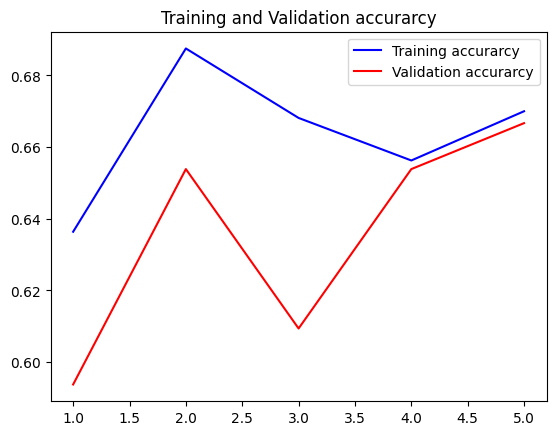

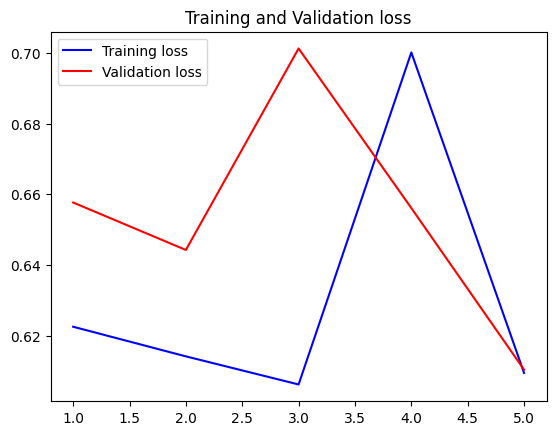

In [61]:
#lets plot the train and val curve
#get the details form the history object
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
#Train and validation accuracy
plt.plot(epochs, acc, 'b', label='Training accurarcy')
plt.plot(epochs, val_acc, 'r', label='Validation accurarcy')
plt.title('Training and Validation accurarcy')
plt.legend()
plt.figure()
#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss')
plt.legend()
plt.show()

In [64]:
X_test, y_test = read_and_process_image(test_imgs[0:10]) #Y_test in this case will be empty.
x = np.array(X_test)
test_datagen = ImageDataGenerator(rescale=1./255)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


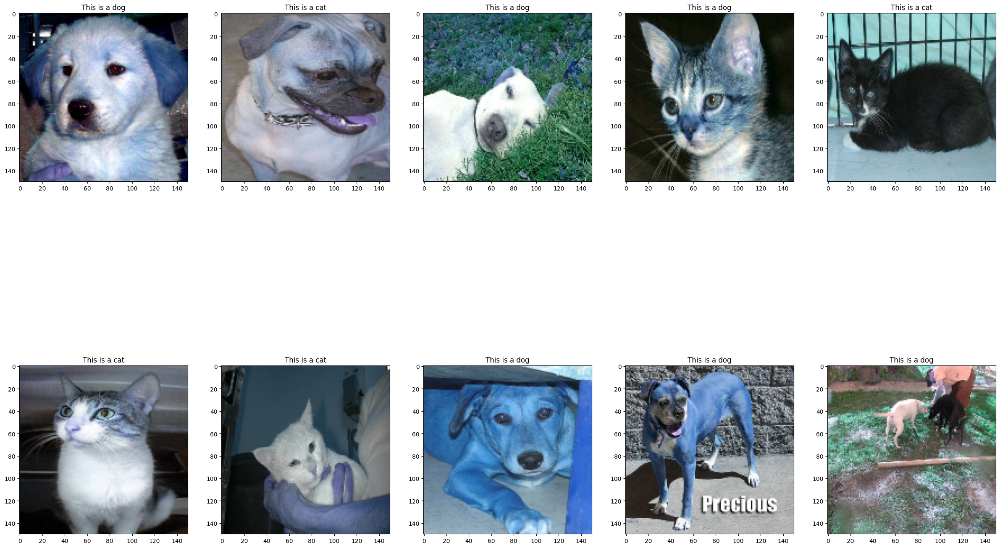

In [66]:
i = 0
text_labels = []
plt.figure(figsize=(30, 20))

# Loop through the test images and make predictions
for batch in test_datagen.flow(x, batch_size=1):
    pred = model.predict(batch)

    # Append the prediction label
    if pred > 0.5:
        text_labels.append('dog')
    else:
        text_labels.append('cat')

    # Plot the image with the predicted label
    plt.subplot(5 // columns + 1, columns, i + 1)
    plt.title('This is a ' + text_labels[i])
    imgplot = plt.imshow(batch[0])

    i += 1
    if i % 10 == 0:
        break

plt.show()